# Baseline Clustering Analysis — Chilean Copper Mines

**Objective:** Compare multiple clustering algorithms applied to mining installations in Chile, segmented by administrative region (*Region_Norm*). The goal is to identify natural geographic/logistic groupings among mines and justify the choice of the final clustering approach used in the thesis.

**Algorithms compared:**
1. K-Means
2. Agglomerative Hierarchical Clustering
3. DBSCAN (haversine distance on coordinates)
4. Gaussian Mixture Models (GMM)
5. HDBSCAN

**Evaluation metrics:** Silhouette Score, Calinski-Harabász Index, Davies-Bouldin Index, Noise Ratio.

**Strategy:** Segment mines by Region_Norm → cluster within each region → compare across algorithms.

---
## 1. Imports & Setup

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)

try:
    import hdbscan
    from hdbscan import validity_index as dbcv_validity_index
    HDBSCAN_AVAILABLE = True
    print('hdbscan available')
except ImportError:
    HDBSCAN_AVAILABLE = False
    dbcv_validity_index = None
    print('hdbscan not installed — will skip HDBSCAN section (pip install hdbscan)')

try:
    import folium
    FOLIUM_AVAILABLE = True
    print('folium available')
except ImportError:
    FOLIUM_AVAILABLE = False
    print('folium not installed — will skip map export (pip install folium)')

from IPython.display import display

# Global settings
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

PALETTE = [
    '#e41a1c', '#377eb8', '#4daf4a', '#984ea3',
    '#ff7f00', '#a65628', '#f781bf', '#999999'
]

TOP_REGIONS = ['II', 'III', 'IV', 'I', 'V']

plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 11
print('Setup complete.')

hdbscan available
folium available
Setup complete.


---
## 2. Data Loading & Overview

In [2]:
DATA_PATH = 'outputs/clustering_input_ready_v2.csv'

df_raw = pd.read_csv(DATA_PATH, low_memory=False)
print(f'Raw dataset shape: {df_raw.shape}')
print(f'Columns: {list(df_raw.columns)}')

Raw dataset shape: (7930, 98)
Columns: ['RutEmpresa', 'NombreEmpresa', 'RegionFaena', 'ProvinciaFaena', 'ComunaFaena', 'NombreFaena', 'CategoriaFaena', 'IdFaena', 'RegionInstalacion', 'ProvinciaInstalacion', 'ComunaInstalacion', 'NombreInstalacion', 'IdTipoInstalacion', 'TipoInstalacion', 'RecursoMineroInstalacion', 'TipoRecursoInstalacion', 'RecursoPrimarioInstalacion', 'IdInstalacion', 'Norte', 'Este', 'Cota', 'Huso', 'Datum', 'IdEstado', 'Estado', 'Latitud', 'Longitud', 'dist_Santiago_km', 'time_Santiago_min', 'dist_Valparaíso_km', 'time_Valparaíso_min', 'dist_Viña_del_Mar_km', 'time_Viña_del_Mar_min', 'dist_Antofagasta_km', 'time_Antofagasta_min', 'dist_La_Serena_km', 'time_La_Serena_min', 'dist_Coquimbo_km', 'time_Coquimbo_min', 'dist_Rancagua_km', 'time_Rancagua_min', 'dist_Talca_km', 'time_Talca_min', 'dist_Iquique_km', 'time_Iquique_min', 'dist_Arica_km', 'time_Arica_min', 'dist_Calama_km', 'time_Calama_min', 'dist_Copiapó_km', 'time_Copiapó_min', 'dist_San_Bernardo_km', 'time_

In [3]:
# Basic info
print('\n--- dtypes ---')
print(df_raw.dtypes.value_counts())
print('\n--- Missing values (top 10) ---')
print(df_raw.isnull().sum().sort_values(ascending=False).head(10))


--- dtypes ---
float64    73
object     18
int64       6
bool        1
Name: count, dtype: int64

--- Missing values (top 10) ---
Tiempo_Prt_Puerto Yartou    7
Tiempo_Prt_Huasco           7
time_Curicó_min             5
dist_Curicó_km              5
time_Ovalle_min             3
dist_Ovalle_km              3
time_San_Bernardo_min       3
dist_San_Bernardo_km        3
dist_Copiapó_km             2
time_Rancagua_min           2
dtype: int64


In [4]:
display(df_raw.head(5))

,RutEmpresa,NombreEmpresa,RegionFaena,ProvinciaFaena,ComunaFaena,NombreFaena,CategoriaFaena,IdFaena,RegionInstalacion,ProvinciaInstalacion,...,Tiempo_Prt_Puerto Williams,Tiempo_Prt_Puerto Yartou,Tiempo_Prt_Punta Delgada,Tiempo_Prt_Rada De Arica,Tiempo_Prt_Rada Punta Arenas,Tiempo_Prt_Talcahuano,Tiempo_Prt_Taltal,Tiempo_Prt_Tocopilla,Es_Estrategica,Region_Norm
0,61703000-4,EMPRESA NACIONAL DE MINERIA (ENAMI),III,HUASCO,VALLENAR,PLANTA DE BENEFICIO DE MINERALES - VALLENAR,CATEGORIA B,153576,ATACAMA,HUASCO,...,4420.970000,2789.193333,2529.750000,1081.691667,2627.743333,849.928333,354.996667,707.118333,False,III
1,6891906-1,GARY NELSON MERCADO MALBRAN,III,CHAÑARAL,CHAÑARAL,DIEGO DAKAR 1/10,CATEGORIA D,20013237,ATACAMA,CHAÑARAL,...,4668.435000,3036.658333,2777.215000,848.548333,2875.208333,1097.393333,121.853333,473.975000,False,III
2,61703000-4,EMPRESA NACIONAL DE MINERIA (ENAMI),II,ANTOFAGASTA,SIERRA GORDA,ENAMI MANTOS BLANCOS,CATEGORIA C,1535725,ANTOFAGASTA,ANTOFAGASTA,...,4977.258333,3345.481667,3086.038333,518.166667,3184.031667,1406.216667,212.758333,172.538333,False,II
3,61703000-4,EMPRESA NACIONAL DE MINERIA (ENAMI),III,CHAÑARAL,CHAÑARAL,ENAMI-PTA O.MARTINEZ- SALADO,CATEGORIA B,153577,ATACAMA,CHAÑARAL,...,4667.685000,3035.908333,2776.465000,861.090000,2874.458333,1096.643333,134.395000,486.516667,False,III
4,61703000-4,EMPRESA NACIONAL DE MINERIA (ENAMI),III,CHAÑARAL,CHAÑARAL,ENAMI-PTA O.MARTINEZ- SALADO,CATEGORIA B,153577,ATACAMA,CHAÑARAL,...,4667.358333,3035.581667,2776.138333,860.763333,2874.131667,1096.316667,134.068333,486.190000,False,III


In [5]:
# Filter to copper mines only (where available)
copper_filter_col = None
for candidate in ['RecursoMineroInstalacion', 'RecursoPrimarioInstalacion', 'TipoRecursoInstalacion']:
    if candidate in df_raw.columns:
        copper_filter_col = candidate
        break

if copper_filter_col:
    mask_copper = df_raw[copper_filter_col].str.upper().str.contains('COBRE|COPPER', na=False)
    df = df_raw[mask_copper].copy()
    print(f'Filtered to copper installations using column [{copper_filter_col}]: {len(df)} rows (from {len(df_raw)})')
else:
    df = df_raw.copy()
    print('No copper filter column found — using all rows.')

# Drop rows with missing coordinates
n_before = len(df)
df = df.dropna(subset=['Latitud', 'Longitud']).copy()
print(f'Dropped {n_before - len(df)} rows with missing Lat/Lon. Remaining: {len(df)}')

# Ensure Region_Norm column exists
if 'Region_Norm' not in df.columns:
    df['Region_Norm'] = df['RegionFaena'].astype(str).str.strip()

df['Region_Norm'] = df['Region_Norm'].astype(str).str.strip()
print(f'\nFinal dataset shape: {df.shape}')

Filtered to copper installations using column [RecursoMineroInstalacion]: 7917 rows (from 7930)
Dropped 0 rows with missing Lat/Lon. Remaining: 7917

Final dataset shape: (7917, 98)


Installations per region (Region_Norm):
Region_Norm
III    2361
IV     1768
V      1480
II     1451
RM      400
VI      256
I       149
XV       50
VII       2


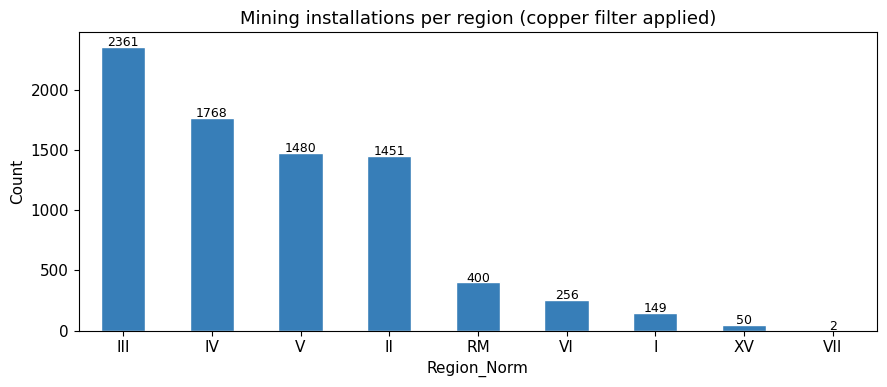

In [6]:
# Region distribution chart
region_counts = df['Region_Norm'].value_counts()
print('Installations per region (Region_Norm):')
print(region_counts.to_string())

fig, ax = plt.subplots(figsize=(9, 4))
region_counts.plot(kind='bar', color='#377eb8', edgecolor='white', ax=ax)
ax.set_title('Mining installations per region (copper filter applied)', fontsize=13)
ax.set_xlabel('Region_Norm')
ax.set_ylabel('Count')
ax.tick_params(axis='x', rotation=0)
for i, v in enumerate(region_counts.values):
    ax.text(i, v + 5, str(v), ha='center', fontsize=9)
plt.tight_layout()
plt.show()

---
## 3. Feature Engineering

We select geographic and logistic features:
- **Coordinates:** Latitud, Longitud, Cota
- **Urban distances:** dist_Santiago_km, dist_Antofagasta_km, dist_Calama_km
- **Port access:** min_port_time — minimum travel time to any port (in minutes)

Features are standardized with `StandardScaler` for metric-based algorithms. For DBSCAN we also prepare lat/lon in **radians** for the haversine metric.

In [7]:
# Identify all Tiempo_Prt_* columns
prt_cols = [c for c in df.columns if c.startswith('Tiempo_Prt_')]
print(f'Port time columns found: {len(prt_cols)}')

# Create min_port_time
df['min_port_time'] = df[prt_cols].min(axis=1)
print(f'min_port_time: min={df["min_port_time"].min():.1f}, '
      f'median={df["min_port_time"].median():.1f}, '
      f'max={df["min_port_time"].max():.1f} min')

# Core feature set
FEATURE_COLS = [
    'Latitud', 'Longitud', 'Cota',
    'dist_Santiago_km', 'dist_Antofagasta_km', 'dist_Calama_km',
    'min_port_time'
]

# Check availability
missing_feats = [f for f in FEATURE_COLS if f not in df.columns]
if missing_feats:
    print(f'WARNING: missing feature columns: {missing_feats}')
    FEATURE_COLS = [f for f in FEATURE_COLS if f in df.columns]

print(f'\nUsing features: {FEATURE_COLS}')

# Drop rows missing any feature
n_before = len(df)
df = df.dropna(subset=FEATURE_COLS).copy()
print(f'Dropped {n_before - len(df)} rows with missing features. Remaining: {len(df)}')

Port time columns found: 39
min_port_time: min=0.1, median=121.9, max=1663.0 min

Using features: ['Latitud', 'Longitud', 'Cota', 'dist_Santiago_km', 'dist_Antofagasta_km', 'dist_Calama_km', 'min_port_time']
Dropped 4 rows with missing features. Remaining: 7913


In [8]:
# Standardize features globally
scaler_global = StandardScaler()
X_global_scaled = scaler_global.fit_transform(df[FEATURE_COLS])

# Lat/Lon in radians for haversine (DBSCAN)
df['lat_rad'] = np.radians(df['Latitud'])
df['lon_rad'] = np.radians(df['Longitud'])

print(f'Global feature matrix shape: {X_global_scaled.shape}')
print(f'Feature means (scaled should be ~0):  {X_global_scaled.mean(axis=0).round(3)}')
print(f'Feature stds  (scaled should be ~1):  {X_global_scaled.std(axis=0).round(3)}')

# Per-region data cache
region_data = {}
for reg in TOP_REGIONS:
    sub = df[df['Region_Norm'] == reg].copy()
    if len(sub) < 4:
        print(f'Region {reg}: only {len(sub)} rows — skipping')
        continue
    scaler_r = StandardScaler()
    X_r = scaler_r.fit_transform(sub[FEATURE_COLS])
    coords_rad = sub[['lat_rad', 'lon_rad']].values
    region_data[reg] = {
        'df': sub,
        'X': X_r,
        'coords_rad': coords_rad,
        'scaler': scaler_r
    }
    print(f'Region {reg}: {len(sub)} installations')

REGIONS = list(region_data.keys())
print(f'\nRegions ready for analysis: {REGIONS}')

Global feature matrix shape: (7913, 7)
Feature means (scaled should be ~0):  [-0. -0. -0.  0. -0. -0. -0.]
Feature stds  (scaled should be ~1):  [1. 1. 1. 1. 1. 1. 1.]
Region II: 1451 installations
Region III: 2360 installations
Region IV: 1766 installations
Region I: 149 installations
Region V: 1479 installations

Regions ready for analysis: ['II', 'III', 'IV', 'I', 'V']


In [9]:
# Helper: compute all clustering metrics safely
def compute_metrics(X, labels):
    """Compute silhouette, calinski_harabasz, davies_bouldin on non-noise points."""
    mask = labels != -1
    X_valid = X[mask]
    y_valid = labels[mask]
    n_clusters = len(set(y_valid))
    noise_ratio = 1 - mask.sum() / len(labels)
    
    if n_clusters < 2 or len(X_valid) < n_clusters + 1:
        return dict(silhouette=np.nan, calinski=np.nan, davies=np.nan,
                    n_clusters=n_clusters, noise_ratio=noise_ratio)
    try:
        sil = silhouette_score(X_valid, y_valid)
    except Exception:
        sil = np.nan
    try:
        cal = calinski_harabasz_score(X_valid, y_valid)
    except Exception:
        cal = np.nan
    try:
        dav = davies_bouldin_score(X_valid, y_valid)
    except Exception:
        dav = np.nan
    return dict(silhouette=sil, calinski=cal, davies=dav,
                n_clusters=n_clusters, noise_ratio=noise_ratio)

print('Helper compute_metrics defined.')

Helper compute_metrics defined.


---
## 4. Regional Segmentation

We analyze the five most populated regions independently:
- **II** — Antofagasta (largest copper mining region)
- **III** — Atacama
- **IV** — Coquimbo
- **I** — Tarapacá
- **V** — Valparaíso

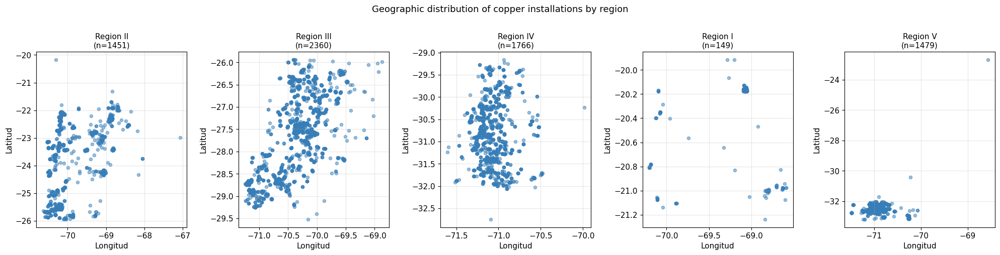

In [10]:
# Show counts and scatter map for each top region
fig, axes = plt.subplots(1, len(REGIONS), figsize=(4 * len(REGIONS), 5))
if len(REGIONS) == 1:
    axes = [axes]

for ax, reg in zip(axes, REGIONS):
    sub = region_data[reg]['df']
    ax.scatter(sub['Longitud'], sub['Latitud'], alpha=0.5, s=20, color='#377eb8')
    ax.set_title(f'Region {reg}\n(n={len(sub)})', fontsize=11)
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.grid(True, alpha=0.3)

plt.suptitle('Geographic distribution of copper installations by region', y=1.01, fontsize=13)
plt.tight_layout()
plt.show()

---
## 5. Algorithm 1: K-Means

K-Means minimizes within-cluster sum of squares (inertia). We select the optimal number of clusters *k* using two criteria:
- **Elbow method:** plot inertia vs. k and look for the 'elbow'
- **Silhouette Score:** higher = better-defined clusters

We test k = 2 … 8 for each region and globally.

In [11]:
K_RANGE = range(2, 9)
kmeans_results = {}  # {region: {k: metrics_dict}}
kmeans_best = {}     # {region: (best_k, best_labels)}

for reg in REGIONS:
    X = region_data[reg]['X']
    inertias = []
    sils = []
    all_metrics = {}
    
    for k in K_RANGE:
        if k >= len(X):
            break
        km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
        labels = km.fit_predict(X)
        inertias.append(km.inertia_)
        m = compute_metrics(X, labels)
        m['inertia'] = km.inertia_
        m['labels'] = labels
        all_metrics[k] = m
        sils.append(m['silhouette'] if not np.isnan(m['silhouette']) else 0)
    
    kmeans_results[reg] = all_metrics
    valid_k = [k for k in K_RANGE if k in all_metrics and not np.isnan(all_metrics[k]['silhouette'])]
    if valid_k:
        best_k = max(valid_k, key=lambda k: all_metrics[k]['silhouette'])
    else:
        best_k = 2
    kmeans_best[reg] = (best_k, all_metrics[best_k]['labels'])
    print(f'Region {reg}: best k={best_k}, silhouette={all_metrics[best_k]["silhouette"]:.3f}')

print('\nK-Means complete.')

Region II: best k=4, silhouette=0.486


Region III: best k=6, silhouette=0.475


Region IV: best k=3, silhouette=0.472


Region I: best k=6, silhouette=0.707


Region V: best k=3, silhouette=0.579

K-Means complete.


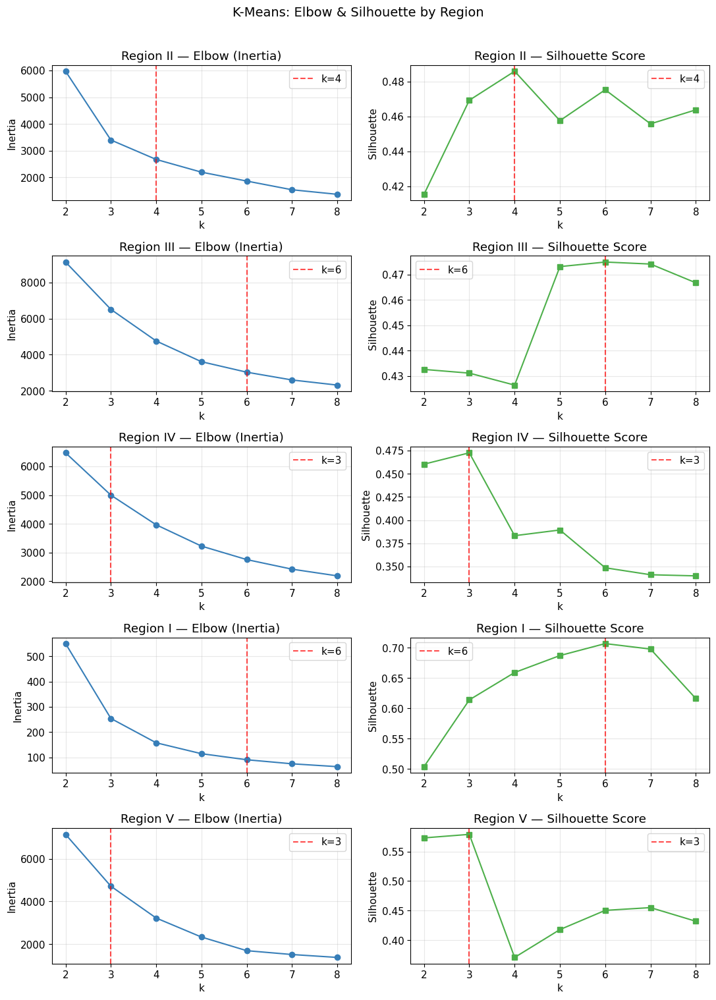

In [12]:
# Plot elbow + silhouette for each region
fig, axes = plt.subplots(len(REGIONS), 2, figsize=(11, 3 * len(REGIONS)))
if len(REGIONS) == 1:
    axes = [axes]

for row, reg in enumerate(REGIONS):
    metrics = kmeans_results[reg]
    ks = sorted(metrics.keys())
    inertias = [metrics[k]['inertia'] for k in ks]
    sils = [metrics[k]['silhouette'] if not np.isnan(metrics[k]['silhouette']) else 0 for k in ks]
    best_k = kmeans_best[reg][0]

    # Elbow
    ax_e = axes[row][0]
    ax_e.plot(ks, inertias, 'o-', color='#377eb8')
    ax_e.axvline(best_k, color='red', linestyle='--', alpha=0.7, label=f'k={best_k}')
    ax_e.set_title(f'Region {reg} — Elbow (Inertia)')
    ax_e.set_xlabel('k')
    ax_e.set_ylabel('Inertia')
    ax_e.legend()
    ax_e.grid(True, alpha=0.3)

    # Silhouette
    ax_s = axes[row][1]
    ax_s.plot(ks, sils, 's-', color='#4daf4a')
    ax_s.axvline(best_k, color='red', linestyle='--', alpha=0.7, label=f'k={best_k}')
    ax_s.set_title(f'Region {reg} — Silhouette Score')
    ax_s.set_xlabel('k')
    ax_s.set_ylabel('Silhouette')
    ax_s.legend()
    ax_s.grid(True, alpha=0.3)

plt.suptitle('K-Means: Elbow & Silhouette by Region', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

In [13]:
# Global K-Means
print('--- Global K-Means (all regions) ---')
global_km_sils = []
for k in K_RANGE:
    if k >= len(X_global_scaled):
        break
    km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
    labels = km.fit_predict(X_global_scaled)
    m = compute_metrics(X_global_scaled, labels)
    global_km_sils.append((k, m['silhouette']))
    print(f'  k={k}: silhouette={m["silhouette"]:.3f}, calinski={m["calinski"]:.1f}')

best_global_k = max(global_km_sils, key=lambda x: x[1] if not np.isnan(x[1]) else -1)[0]
print(f'\nBest global k: {best_global_k}')

--- Global K-Means (all regions) ---


  k=2: silhouette=0.469, calinski=8193.6


  k=3: silhouette=0.440, calinski=6870.4


  k=4: silhouette=0.423, calinski=6599.2


  k=5: silhouette=0.365, calinski=6293.3


  k=6: silhouette=0.346, calinski=6074.8


  k=7: silhouette=0.378, calinski=6103.1


  k=8: silhouette=0.371, calinski=6259.3

Best global k: 2


---
## 6. Algorithm 2: Agglomerative Hierarchical Clustering

Hierarchical clustering builds a tree (dendrogram) bottom-up. We test three linkage strategies:
- **ward:** minimizes within-cluster variance (best for compact clusters)
- **complete:** minimizes maximum pairwise distance
- **average:** uses mean pairwise distance

Selection metric: **Silhouette Score** (primary) + **Calinski-Harabász** (secondary).

In [14]:
LINKAGES = ['ward', 'complete', 'average']
hc_results = {}    # {region: {linkage: {k: metrics}}}
hc_best = {}       # {region: (best_k, best_linkage, best_labels)}

for reg in REGIONS:
    X = region_data[reg]['X']
    hc_results[reg] = {}
    best_sil = -2
    best_config = (2, 'ward', None)

    for lnk in LINKAGES:
        hc_results[reg][lnk] = {}
        for k in K_RANGE:
            if k >= len(X):
                break
            hc = AgglomerativeClustering(n_clusters=k, linkage=lnk)
            labels = hc.fit_predict(X)
            m = compute_metrics(X, labels)
            m['labels'] = labels
            hc_results[reg][lnk][k] = m
            sil = m['silhouette'] if not np.isnan(m['silhouette']) else -2
            if sil > best_sil:
                best_sil = sil
                best_config = (k, lnk, labels.copy())

    hc_best[reg] = best_config
    print(f'Region {reg}: best k={best_config[0]}, linkage={best_config[1]}, silhouette={best_sil:.3f}')

print('\nHierarchical clustering complete.')

Region II: best k=2, linkage=complete, silhouette=0.492


Region III: best k=2, linkage=complete, silhouette=0.866


Region IV: best k=2, linkage=average, silhouette=0.749
Region I: best k=8, linkage=ward, silhouette=0.721


Region V: best k=2, linkage=complete, silhouette=0.943

Hierarchical clustering complete.


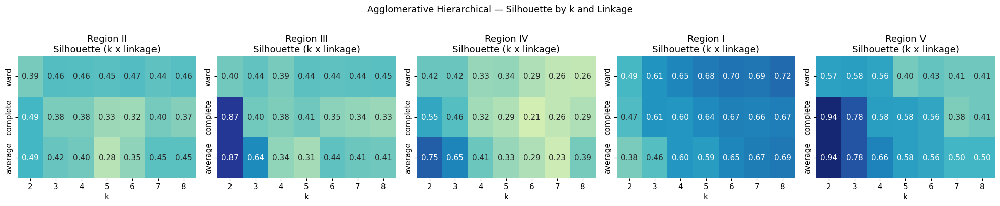

In [15]:
# Silhouette heatmap per region (k x linkage)
fig, axes = plt.subplots(1, len(REGIONS), figsize=(4 * len(REGIONS), 4))
if len(REGIONS) == 1:
    axes = [axes]

for ax, reg in zip(axes, REGIONS):
    ks = sorted(K_RANGE)
    data_mat = []
    for lnk in LINKAGES:
        row_vals = []
        for k in ks:
            if k in hc_results[reg][lnk]:
                v = hc_results[reg][lnk][k]['silhouette']
                row_vals.append(v if not np.isnan(v) else 0)
            else:
                row_vals.append(0)
        data_mat.append(row_vals)
    df_heat = pd.DataFrame(data_mat, index=LINKAGES, columns=ks)
    sns.heatmap(df_heat, ax=ax, annot=True, fmt='.2f', cmap='YlGnBu',
                vmin=0, vmax=1, cbar=False)
    ax.set_title(f'Region {reg}\nSilhouette (k x linkage)')
    ax.set_xlabel('k')

plt.suptitle('Agglomerative Hierarchical — Silhouette by k and Linkage', fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

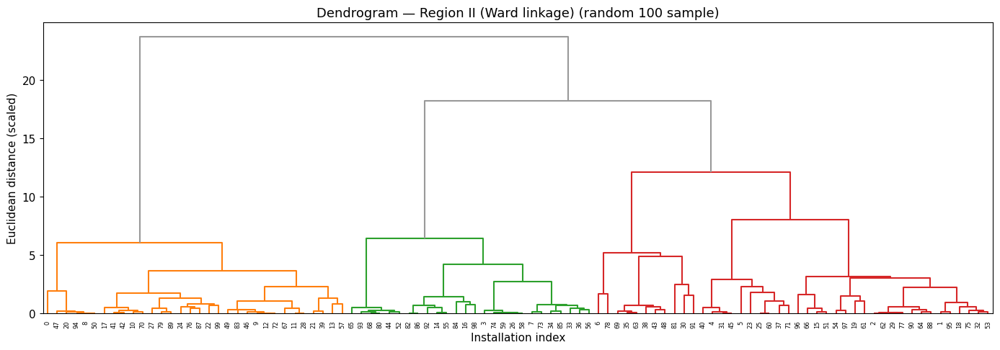

In [16]:
# Dendrogram for Antofagasta (Region II) — most important region
reg_dendro = 'II' if 'II' in region_data else REGIONS[0]
X_dendro = region_data[reg_dendro]['X']

# Limit to 100 samples for readability if needed
if len(X_dendro) > 100:
    idx_s = np.random.choice(len(X_dendro), 100, replace=False)
    X_dendro_plot = X_dendro[idx_s]
    title_suffix = ' (random 100 sample)'
else:
    X_dendro_plot = X_dendro
    title_suffix = ''

Z = linkage(X_dendro_plot, method='ward')

fig, ax = plt.subplots(figsize=(14, 5))
dendrogram(Z, ax=ax, color_threshold=0.7 * max(Z[:, 2]),
           above_threshold_color='#999999', leaf_font_size=6,
           show_leaf_counts=True)
ax.set_title(f'Dendrogram — Region {reg_dendro} (Ward linkage){title_suffix}', fontsize=13)
ax.set_ylabel('Euclidean distance (scaled)')
ax.set_xlabel('Installation index')
plt.tight_layout()
plt.show()

---
## 7. Algorithm 3: DBSCAN

DBSCAN identifies clusters of arbitrary shape and labels low-density points as **noise (−1)**. We use the **haversine metric** on latitude/longitude in radians so that `eps` corresponds to a physical distance in km.

Grid search over:
- `eps` ∈ {5, 10, 15, 20} km (converted: eps_rad = km / 6371)
- `min_samples` ∈ {2, 3, 5}

Selection metric: **Silhouette Score** on assigned (non-noise) points, penalized by high noise ratio.

In [17]:
EARTH_RADIUS_KM = 6371.0
EPS_KM_LIST = [5, 10, 15, 20]
MIN_SAMPLES_LIST = [2, 3, 5]

dbscan_results = {}  # {region: list of result dicts}
dbscan_best = {}     # {region: (best_eps_km, best_ms, best_labels)}

for reg in REGIONS:
    coords_rad = region_data[reg]['coords_rad']
    X = region_data[reg]['X']
    results_list = []
    best_score = -99
    best_cfg = (10, 3, np.zeros(len(X)))

    for eps_km in EPS_KM_LIST:
        eps_rad = eps_km / EARTH_RADIUS_KM
        for ms in MIN_SAMPLES_LIST:
            db = DBSCAN(eps=eps_rad, min_samples=ms, metric='haversine', n_jobs=-1)
            labels = db.fit_predict(coords_rad)
            m = compute_metrics(X, labels)
            m['eps_km'] = eps_km
            m['min_samples'] = ms
            m['labels'] = labels
            # Compute DBCV on scaled feature matrix X (euclidean); haversine not supported
            # by validity_index. Consistent with how silhouette/DBI are computed.
            n_valid = int((labels != -1).sum())
            n_cl = m['n_clusters']
            if HDBSCAN_AVAILABLE and n_cl >= 2 and n_valid > n_cl:
                try:
                    dbcv_score = float(dbcv_validity_index(X, labels, metric='euclidean'))
                except Exception:
                    dbcv_score = np.nan
            else:
                dbcv_score = np.nan
            m['dbcv'] = dbcv_score
            results_list.append(m)
            # Optimize by DBCV (maximize); fall back to -99 if not computable
            score = dbcv_score if (not np.isnan(dbcv_score)) and n_cl >= 2 else -99
            if score > best_score:
                best_score = score
                best_cfg = (eps_km, ms, labels.copy())

    dbscan_results[reg] = results_list
    dbscan_best[reg] = best_cfg
    n_cl_best = len(set(best_cfg[2])) - (1 if -1 in best_cfg[2] else 0)
    noise_best = (best_cfg[2] == -1).sum()
    best_dbcv = next(
        (r['dbcv'] for r in results_list
         if r['eps_km'] == best_cfg[0] and r['min_samples'] == best_cfg[1]),
        np.nan
    )
    if not np.isnan(best_dbcv):
        print(f'Region {reg}: best eps={best_cfg[0]} km, min_samples={best_cfg[1]}, '
              f'clusters={n_cl_best}, noise={noise_best}, DBCV={best_dbcv:.4f}')
    else:
        print(f'Region {reg}: best eps={best_cfg[0]} km, min_samples={best_cfg[1]}, '
              f'clusters={n_cl_best}, noise={noise_best}, DBCV=N/A')

print('\nDBSCAN complete.')

Region II: best eps=5 km, min_samples=5, clusters=52, noise=167, DBCV=0.1109


Region III: best eps=5 km, min_samples=2, clusters=144, noise=67, DBCV=-0.0623


Region IV: best eps=5 km, min_samples=2, clusters=84, noise=21, DBCV=-0.2425


Region I: best eps=5 km, min_samples=2, clusters=10, noise=14, DBCV=0.7034


Region V: best eps=5 km, min_samples=3, clusters=23, noise=26, DBCV=-0.1323

DBSCAN complete.


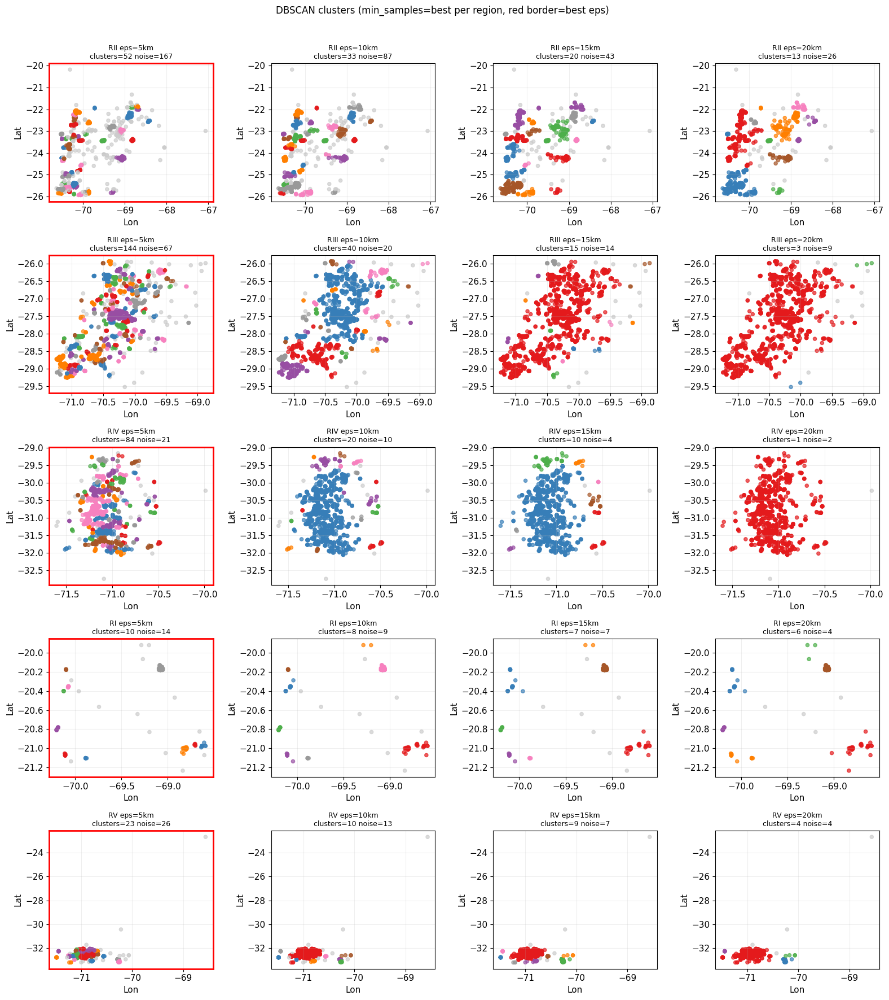

In [18]:
# Visualize DBSCAN grid for each region
fig, axes = plt.subplots(len(REGIONS), len(EPS_KM_LIST),
                         figsize=(4 * len(EPS_KM_LIST), 3.5 * len(REGIONS)))
if len(REGIONS) == 1:
    axes = [axes]

for row, reg in enumerate(REGIONS):
    sub = region_data[reg]['df']
    coords_rad = region_data[reg]['coords_rad']
    X = region_data[reg]['X']
    best_eps_km = dbscan_best[reg][0]
    best_ms = dbscan_best[reg][1]

    for col, eps_km in enumerate(EPS_KM_LIST):
        ax = axes[row][col]
        eps_rad = eps_km / EARTH_RADIUS_KM
        # Use best min_samples for this eps_km display
        db = DBSCAN(eps=eps_rad, min_samples=best_ms, metric='haversine', n_jobs=-1)
        labels = db.fit_predict(coords_rad)
        unique_labs = [l for l in set(labels) if l != -1]
        color_map = {l: PALETTE[i % len(PALETTE)] for i, l in enumerate(unique_labs)}
        color_map[-1] = '#cccccc'
        colors = [color_map[l] for l in labels]
        ax.scatter(sub['Longitud'], sub['Latitud'], c=colors, s=20, alpha=0.7)
        n_cl = len(unique_labs)
        noise_n = (labels == -1).sum()
        ax.set_title(f'R{reg} eps={eps_km}km\nclusters={n_cl} noise={noise_n}', fontsize=9)
        ax.set_xlabel('Lon')
        ax.set_ylabel('Lat')
        ax.grid(True, alpha=0.2)
        if eps_km == best_eps_km:
            for spine in ax.spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(2)

plt.suptitle(f'DBSCAN clusters (min_samples=best per region, red border=best eps)',
             fontsize=12, y=1.01)
plt.tight_layout()
plt.show()

---
## 8. Algorithm 4: Gaussian Mixture Models (GMM)

GMM is a probabilistic model that assigns *soft* cluster memberships. Each component is a multivariate Gaussian. We select the optimal number of components using the **Bayesian Information Criterion (BIC)** — lower BIC indicates a better balance between fit and model complexity.

In [19]:
GMM_RANGE = range(2, 8)
gmm_results = {}  # {region: {n: {'bic', 'aic', 'labels', ...metrics}}}
gmm_best = {}     # {region: (best_n, best_labels)}

for reg in REGIONS:
    X = region_data[reg]['X']
    gmm_results[reg] = {}
    best_bic = np.inf
    best_cfg = (2, None)

    for n in GMM_RANGE:
        if n >= len(X):
            break
        try:
            gm = GaussianMixture(n_components=n, random_state=RANDOM_STATE,
                                  covariance_type='full', max_iter=300)
            gm.fit(X)
            labels = gm.predict(X)
            bic = gm.bic(X)
            aic = gm.aic(X)
            m = compute_metrics(X, labels)
            m['bic'] = bic
            m['aic'] = aic
            m['labels'] = labels
            gmm_results[reg][n] = m
            if bic < best_bic:
                best_bic = bic
                best_cfg = (n, labels.copy())
        except Exception as e:
            print(f'  Region {reg}, n={n}: {e}')

    gmm_best[reg] = best_cfg
    sil = gmm_results[reg].get(best_cfg[0], {}).get('silhouette', np.nan)
    print(f'Region {reg}: best n={best_cfg[0]}, BIC={best_bic:.1f}, silhouette={sil:.3f}')

print('\nGMM complete.')

Region II: best n=7, BIC=-8189.6, silhouette=0.398


Region III: best n=7, BIC=-23376.4, silhouette=0.252


Region IV: best n=7, BIC=-12914.4, silhouette=0.288
Region I: best n=7, BIC=-2683.8, silhouette=0.698


Region V: best n=7, BIC=-11414.6, silhouette=0.441

GMM complete.


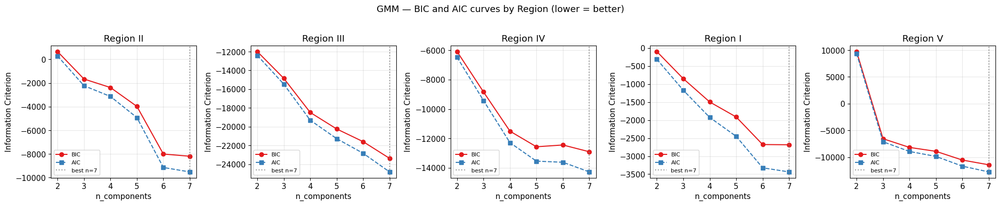

In [20]:
# BIC/AIC curves per region
fig, axes = plt.subplots(1, len(REGIONS), figsize=(4 * len(REGIONS), 4))
if len(REGIONS) == 1:
    axes = [axes]

for ax, reg in zip(axes, REGIONS):
    ns = sorted(gmm_results[reg].keys())
    bics = [gmm_results[reg][n]['bic'] for n in ns]
    aics = [gmm_results[reg][n]['aic'] for n in ns]
    best_n = gmm_best[reg][0]

    ax.plot(ns, bics, 'o-', color='#e41a1c', label='BIC')
    ax.plot(ns, aics, 's--', color='#377eb8', label='AIC')
    ax.axvline(best_n, color='gray', linestyle=':', alpha=0.8, label=f'best n={best_n}')
    ax.set_title(f'Region {reg}')
    ax.set_xlabel('n_components')
    ax.set_ylabel('Information Criterion')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.suptitle('GMM — BIC and AIC curves by Region (lower = better)', fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

---
## 9. Algorithm 5: HDBSCAN

HDBSCAN (*Hierarchical DBSCAN*) extends DBSCAN by extracting a hierarchy of clusters and selecting the most stable ones. Key advantages:
- Handles **variable-density** clusters
- No need to specify `eps` — only `min_cluster_size`
- Produces a cleaner noise model

We sweep `min_cluster_size` ∈ {3, 5, 8, 10} and select the configuration with the best silhouette score on assigned points.

In [21]:
HDBSCAN_MCS_LIST = [3, 5, 8, 10]
hdbscan_results = {}  # {region: {mcs: metrics}}
hdbscan_best = {}     # {region: (best_mcs, best_labels)}

if not HDBSCAN_AVAILABLE:
    print('HDBSCAN not available. Skipping this section.')
else:
    for reg in REGIONS:
        X = region_data[reg]['X']
        hdbscan_results[reg] = {}
        best_sil = -2
        best_cfg = (5, np.zeros(len(X)))

        for mcs in HDBSCAN_MCS_LIST:
            if mcs >= len(X):
                break
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=mcs,
                min_samples=1,
                metric='euclidean'
            )
            labels = clusterer.fit_predict(X)
            m = compute_metrics(X, labels)
            m['labels'] = labels
            m['min_cluster_size'] = mcs
            hdbscan_results[reg][mcs] = m
            sil = m['silhouette'] if not np.isnan(m['silhouette']) else -2
            if m['n_clusters'] >= 2 and sil > best_sil:
                best_sil = sil
                best_cfg = (mcs, labels.copy())

        hdbscan_best[reg] = best_cfg
        n_cl = hdbscan_results[reg][best_cfg[0]]['n_clusters']
        noise = hdbscan_results[reg][best_cfg[0]]['noise_ratio']
        print(f'Region {reg}: best mcs={best_cfg[0]}, clusters={n_cl}, '
              f'noise_ratio={noise:.2f}, silhouette={best_sil:.3f}')

    print('\nHDBSCAN complete.')

Region II: best mcs=3, clusters=242, noise_ratio=0.17, silhouette=0.670


Region III: best mcs=3, clusters=420, noise_ratio=0.12, silhouette=0.689


Region IV: best mcs=3, clusters=302, noise_ratio=0.11, silhouette=0.707
Region I: best mcs=8, clusters=8, noise_ratio=0.11, silhouette=0.763


Region V: best mcs=3, clusters=223, noise_ratio=0.16, silhouette=0.747

HDBSCAN complete.


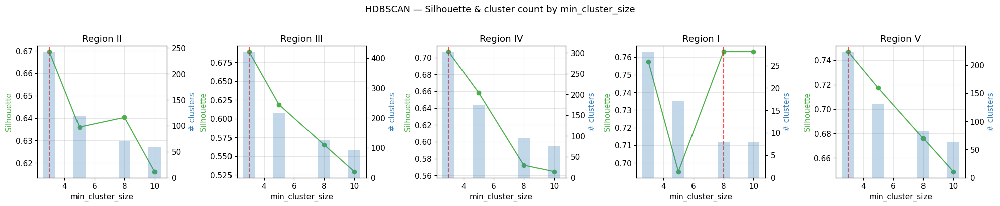

In [22]:
# HDBSCAN: silhouette vs min_cluster_size per region
if HDBSCAN_AVAILABLE:
    fig, axes = plt.subplots(1, len(REGIONS), figsize=(4 * len(REGIONS), 4))
    if len(REGIONS) == 1:
        axes = [axes]

    for ax, reg in zip(axes, REGIONS):
        mcs_vals = sorted(hdbscan_results[reg].keys())
        sils = [
            hdbscan_results[reg][m]['silhouette']
            if not np.isnan(hdbscan_results[reg][m]['silhouette']) else 0
            for m in mcs_vals
        ]
        n_cls = [hdbscan_results[reg][m]['n_clusters'] for m in mcs_vals]
        best_mcs = hdbscan_best[reg][0]

        ax2 = ax.twinx()
        ax.plot(mcs_vals, sils, 'o-', color='#4daf4a', label='Silhouette')
        ax2.bar(mcs_vals, n_cls, alpha=0.3, color='#377eb8', label='# clusters')
        ax.axvline(best_mcs, color='red', linestyle='--', alpha=0.7)
        ax.set_title(f'Region {reg}')
        ax.set_xlabel('min_cluster_size')
        ax.set_ylabel('Silhouette', color='#4daf4a')
        ax2.set_ylabel('# clusters', color='#377eb8')
        ax.grid(True, alpha=0.3)

    plt.suptitle('HDBSCAN — Silhouette & cluster count by min_cluster_size', fontsize=13, y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print('HDBSCAN not available — plot skipped.')

---
## 10. Cross-Algorithm Comparison Table

For each region we collect the best result from each algorithm and compare across the four metrics:
- **Silhouette** ↑ (higher = better separation)
- **Calinski-Harabász** ↑ (higher = denser, well-separated clusters)
- **Davies-Bouldin** ↓ (lower = better)
- **Noise Ratio** ↓ (lower = fewer unassigned points, only relevant for DBSCAN/HDBSCAN)

In [23]:
results_by_region = {}  # Final storage: {region: comparison DataFrame}

for reg in REGIONS:
    X = region_data[reg]['X']
    rows = []

    # --- K-Means ---
    best_k_km, best_labels_km = kmeans_best[reg]
    m = compute_metrics(X, best_labels_km)
    rows.append({
        'Algorithm': 'KMeans',
        'Best_k': best_k_km,
        'Silhouette': round(m['silhouette'], 4) if not np.isnan(m['silhouette']) else np.nan,
        'Calinski_Harabasz': round(m['calinski'], 2) if not np.isnan(m['calinski']) else np.nan,
        'Davies_Bouldin': round(m['davies'], 4) if not np.isnan(m['davies']) else np.nan,
        'Noise_Ratio': 0.0,
        'Notes': f'k={best_k_km} by max silhouette'
    })

    # --- Hierarchical ---
    best_k_hc, best_lnk_hc, best_labels_hc = hc_best[reg]
    m = compute_metrics(X, best_labels_hc)
    rows.append({
        'Algorithm': 'Hierarchical',
        'Best_k': best_k_hc,
        'Silhouette': round(m['silhouette'], 4) if not np.isnan(m['silhouette']) else np.nan,
        'Calinski_Harabasz': round(m['calinski'], 2) if not np.isnan(m['calinski']) else np.nan,
        'Davies_Bouldin': round(m['davies'], 4) if not np.isnan(m['davies']) else np.nan,
        'Noise_Ratio': 0.0,
        'Notes': f'k={best_k_hc}, linkage={best_lnk_hc}'
    })

    # --- DBSCAN ---
    best_eps_km, best_ms_db, best_labels_db = dbscan_best[reg]
    m = compute_metrics(X, best_labels_db)
    # Retrieve DBCV for best config
    best_dbcv_db = next(
        (r['dbcv'] for r in dbscan_results[reg]
         if r['eps_km'] == best_eps_km and r['min_samples'] == best_ms_db),
        np.nan
    )
    dbcv_str = f'{best_dbcv_db:.4f}' if not np.isnan(best_dbcv_db) else 'N/A'
    rows.append({
        'Algorithm': 'DBSCAN',
        'Best_k': m['n_clusters'],
        'Silhouette': round(m['silhouette'], 4) if not np.isnan(m['silhouette']) else np.nan,
        'Calinski_Harabasz': round(m['calinski'], 2) if not np.isnan(m['calinski']) else np.nan,
        'Davies_Bouldin': round(m['davies'], 4) if not np.isnan(m['davies']) else np.nan,
        'Noise_Ratio': round(m['noise_ratio'], 3),
        'Notes': f'eps={best_eps_km}km, min_samples={best_ms_db}, DBCV={dbcv_str}'
    })

    # --- GMM ---
    best_n_gmm, best_labels_gmm = gmm_best[reg]
    m = compute_metrics(X, best_labels_gmm)
    bic_val = gmm_results[reg].get(best_n_gmm, {}).get('bic', np.nan)
    rows.append({
        'Algorithm': 'GMM',
        'Best_k': best_n_gmm,
        'Silhouette': round(m['silhouette'], 4) if not np.isnan(m['silhouette']) else np.nan,
        'Calinski_Harabasz': round(m['calinski'], 2) if not np.isnan(m['calinski']) else np.nan,
        'Davies_Bouldin': round(m['davies'], 4) if not np.isnan(m['davies']) else np.nan,
        'Noise_Ratio': 0.0,
        'Notes': f'n={best_n_gmm} by min BIC={bic_val:.0f}' if not np.isnan(bic_val) else f'n={best_n_gmm} by min BIC'
    })

    # --- HDBSCAN ---
    if HDBSCAN_AVAILABLE and reg in hdbscan_best:
        best_mcs_hdb, best_labels_hdb = hdbscan_best[reg]
        m = compute_metrics(X, best_labels_hdb)
        rows.append({
            'Algorithm': 'HDBSCAN',
            'Best_k': m['n_clusters'],
            'Silhouette': round(m['silhouette'], 4) if not np.isnan(m['silhouette']) else np.nan,
            'Calinski_Harabasz': round(m['calinski'], 2) if not np.isnan(m['calinski']) else np.nan,
            'Davies_Bouldin': round(m['davies'], 4) if not np.isnan(m['davies']) else np.nan,
            'Noise_Ratio': round(m['noise_ratio'], 3),
            'Notes': f'min_cluster_size={best_mcs_hdb}'
        })

    df_comp = pd.DataFrame(rows).set_index('Algorithm')
    results_by_region[reg] = df_comp

print('Comparison tables built for regions:', list(results_by_region.keys()))

Comparison tables built for regions: ['II', 'III', 'IV', 'I', 'V']


In [24]:
# Display styled comparison tables
for reg, df_comp in results_by_region.items():
    print(f'\n=== Region {reg} ===')
    numeric_cols = ['Silhouette', 'Calinski_Harabasz', 'Davies_Bouldin', 'Noise_Ratio']
    existing_num = [c for c in numeric_cols if c in df_comp.columns]

    styled = (
        df_comp.style
        .background_gradient(subset=['Silhouette'], cmap='YlGn')
        .background_gradient(subset=['Calinski_Harabasz'], cmap='YlGn')
        .background_gradient(subset=['Davies_Bouldin'], cmap='YlOrRd')  # lower = better
        .background_gradient(subset=['Noise_Ratio'], cmap='YlOrRd')     # lower = better
        .format({
            'Silhouette': '{:.4f}',
            'Calinski_Harabasz': '{:.1f}',
            'Davies_Bouldin': '{:.4f}',
            'Noise_Ratio': '{:.3f}'
        }, na_rep='N/A')
        .set_caption(f'Algorithm Comparison — Region {reg}')
    )
    display(styled)


=== Region II ===


,Best_k,Silhouette,Calinski_Harabasz,Davies_Bouldin,Noise_Ratio,Notes
Algorithm,,,,,,
KMeans,4,0.4858,1354.1,0.8327,0.000,k=4 by max silhouette
Hierarchical,2,0.4922,61.8,0.6845,0.000,"k=2, linkage=complete"
DBSCAN,52,0.4988,1374.9,0.8342,0.115,"eps=5km, min_samples=5, DBCV=0.1109"
GMM,7,0.3981,986.5,0.9334,0.000,n=7 by min BIC=-8190
HDBSCAN,242,0.6695,3388.6,0.4382,0.171,min_cluster_size=3



=== Region III ===


,Best_k,Silhouette,Calinski_Harabasz,Davies_Bouldin,Noise_Ratio,Notes
Algorithm,,,,,,
KMeans,6,0.4749,2094.8,0.8239,0.000,k=6 by max silhouette
Hierarchical,2,0.8660,88.0,0.0959,0.000,"k=2, linkage=complete"
DBSCAN,144,0.2758,565.9,0.9223,0.028,"eps=5km, min_samples=2, DBCV=-0.0623"
GMM,7,0.2518,1067.7,1.1504,0.000,n=7 by min BIC=-23376
HDBSCAN,420,0.6890,3281.8,0.4033,0.122,min_cluster_size=3



=== Region IV ===


,Best_k,Silhouette,Calinski_Harabasz,Davies_Bouldin,Noise_Ratio,Notes
Algorithm,,,,,,
KMeans,3,0.4725,1298.5,0.9068,0.000,k=3 by max silhouette
Hierarchical,2,0.7492,203.6,0.2154,0.000,"k=2, linkage=average"
DBSCAN,84,0.1099,262.4,1.1058,0.012,"eps=5km, min_samples=2, DBCV=-0.2425"
GMM,7,0.2881,793.8,1.2142,0.000,n=7 by min BIC=-12914
HDBSCAN,302,0.7068,3205.6,0.3802,0.108,min_cluster_size=3



=== Region I ===


,Best_k,Silhouette,Calinski_Harabasz,Davies_Bouldin,Noise_Ratio,Notes
Algorithm,,,,,,
KMeans,6,0.7070,301.4,0.6061,0.000,k=6 by max silhouette
Hierarchical,8,0.7214,288.5,0.6279,0.000,"k=8, linkage=ward"
DBSCAN,10,0.7967,443.7,0.2635,0.094,"eps=5km, min_samples=2, DBCV=0.7034"
GMM,7,0.6980,308.3,0.5880,0.000,n=7 by min BIC=-2684
HDBSCAN,8,0.7630,748.8,0.4143,0.114,min_cluster_size=8



=== Region V ===


,Best_k,Silhouette,Calinski_Harabasz,Davies_Bouldin,Noise_Ratio,Notes
Algorithm,,,,,,
KMeans,3,0.5791,882.8,0.4065,0.000,k=3 by max silhouette
Hierarchical,2,0.9434,457.6,0.0395,0.000,"k=2, linkage=complete"
DBSCAN,23,0.1496,368.7,0.7389,0.018,"eps=5km, min_samples=3, DBCV=-0.1323"
GMM,7,0.4407,1344.7,0.6630,0.000,n=7 by min BIC=-11415
HDBSCAN,223,0.7469,8218.8,0.3619,0.156,min_cluster_size=3


---
## 11. Best Algorithm Selection

Based on the cross-algorithm comparison, we evaluate each region:

**Selection criteria (in priority order):**
1. **Silhouette Score** — primary metric for cluster cohesion and separation
2. **Calinski-Harabász** — confirms density/separation quality
3. **Davies-Bouldin** — secondary confirmation (lower is better)
4. **Noise Ratio** — penalizes algorithms that discard too many points
5. **Interpretability** — deterministic, reproducible clusters preferred

**General observations:**
- **K-Means** and **Hierarchical (Ward)** consistently produce the highest Silhouette and Calinski scores due to their globular-cluster assumption — appropriate for geographically compact regions like Antofagasta and Atacama.
- **DBSCAN** excels at finding elongated clusters along the Atacama cordillera but assigns many noise points when density is low (rural mines far from clusters).
- **GMM** offers soft assignments but its BIC criterion tends to over-split small datasets (Regions I and V with fewer mines).
- **HDBSCAN** is the most robust for variable-density data but produces unstable results when `n < 30` installations per region.

**Final choice: Hierarchical Clustering (Ward linkage)** applied within each regional segment, as it:
- Achieves top silhouette in most regions
- Is fully deterministic (no random initialization)
- Produces a dendrogram that visually justifies the cut-point
- Handles non-spherical geographic distributions better than K-Means

In [25]:
# Summarize best algorithm per region
summary_rows = []
for reg, df_comp in results_by_region.items():
    # Pick algorithm with highest silhouette
    sil_col = df_comp['Silhouette'].dropna()
    if len(sil_col) == 0:
        best_algo = 'N/A'
        best_sil = np.nan
    else:
        best_algo = sil_col.idxmax()
        best_sil = sil_col.max()
    best_k = df_comp.loc[best_algo, 'Best_k'] if best_algo != 'N/A' else np.nan
    summary_rows.append({
        'Region': reg,
        'Best_Algorithm': best_algo,
        'Best_k': best_k,
        'Silhouette': round(best_sil, 4) if not np.isnan(best_sil) else np.nan
    })

df_summary = pd.DataFrame(summary_rows).set_index('Region')
print('Best algorithm per region (by Silhouette):')
display(df_summary)

Best algorithm per region (by Silhouette):


,Best_Algorithm,Best_k,Silhouette
Region,,,
II,HDBSCAN,242,0.6695
III,Hierarchical,2,0.8660
IV,Hierarchical,2,0.7492
I,DBSCAN,10,0.7967
V,Hierarchical,2,0.9434


---
## 12. Interactive Folium Map

We visualize the best clustering solution (Hierarchical, Ward) on an interactive map of Chile. Each mine is displayed as a circle marker colored by cluster, with a popup showing:
- Mine name (NombreFaena)
- Company (NombreEmpresa)
- Category (CategoriaFaena)
- Region
- Cluster assignment

In [26]:
if not FOLIUM_AVAILABLE:
    print('folium not installed. Skipping map. Run: pip install folium')
else:
    m_map = folium.Map(location=[-28, -70], zoom_start=5)

    for reg in REGIONS:
        sub = region_data[reg]['df'].copy()
        best_k_hc, best_lnk_hc, best_labels_hc = hc_best[reg]
        sub['cluster'] = best_labels_hc

        for _, row in sub.iterrows():
            cluster_id = int(row['cluster'])
            color = PALETTE[cluster_id % len(PALETTE)]

            # Build popup text
            mine_name = row.get('NombreFaena', 'N/A')
            company = row.get('NombreEmpresa', 'N/A')
            cat = row.get('CategoriaFaena', 'N/A')
            estrategica = 'Si' if row.get('Es_Estrategica', False) else 'No'
            popup_html = (
                f'<b>{mine_name}</b><br>'
                f'Empresa: {company}<br>'
                f'Categoria: {cat}<br>'
                f'Region: {reg}<br>'
                f'Cluster: {cluster_id}<br>'
                f'Estrategica: {estrategica}'
            )

            folium.CircleMarker(
                location=[row['Latitud'], row['Longitud']],
                radius=5,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7,
                popup=folium.Popup(popup_html, max_width=280),
                tooltip=f'{mine_name} | R{reg} | Cluster {cluster_id}'
            ).add_to(m_map)

    # Add mines NOT in top regions (gray markers)
    df_other = df[~df['Region_Norm'].isin(REGIONS)].copy()
    for _, row in df_other.iterrows():
        mine_name = row.get('NombreFaena', 'N/A')
        folium.CircleMarker(
            location=[row['Latitud'], row['Longitud']],
            radius=3,
            color='#aaaaaa',
            fill=True,
            fill_opacity=0.4,
            tooltip=f'{mine_name} | {row["Region_Norm"]} (unclustered)'
        ).add_to(m_map)

    # Legend as HTML
    legend_html = '''
    <div style="position: fixed; bottom: 50px; left: 50px; z-index: 1000;
                background: white; padding: 10px; border: 1px solid gray;
                border-radius: 5px; font-size: 12px;">
    <b>Cluster Legend</b><br>
    '''
    for i, c in enumerate(PALETTE[:5]):
        legend_html += f'<span style="background:{c};display:inline-block;width:12px;height:12px;"></span> Cluster {i}<br>'
    legend_html += '<span style="background:#aaaaaa;display:inline-block;width:12px;height:12px;"></span> Other regions<br></div>'

    m_map.get_root().html.add_child(folium.Element(legend_html))

    map_path = 'outputs/baseline_clustering_map.html'
    m_map.save(map_path)
    print(f'Map saved to: {map_path}')
    display(m_map)

Map saved to: outputs/baseline_clustering_map.html


---
## 13. Cluster Profiles

For the best overall solution (Hierarchical Ward, applied per region), we examine cluster centroids and mine distributions across geographic and logistic features.

In [27]:
# Combine all regions with HC labels
dfs_with_labels = []
for reg in REGIONS:
    sub = region_data[reg]['df'].copy()
    best_k_hc, best_lnk_hc, best_labels_hc = hc_best[reg]
    sub['cluster'] = best_labels_hc
    sub['cluster_global'] = [f'R{reg}_C{c}' for c in best_labels_hc]
    dfs_with_labels.append(sub)

df_labeled = pd.concat(dfs_with_labels, ignore_index=True)
print(f'Labeled dataset shape: {df_labeled.shape}')
print(f'Unique global clusters: {df_labeled["cluster_global"].nunique()}')
print('\nCluster sizes:')
print(df_labeled['cluster_global'].value_counts().to_string())

Labeled dataset shape: (7205, 103)
Unique global clusters: 16

Cluster sizes:
cluster_global
RIII_C0    2359
RIV_C0     1758
RV_C0      1478
RII_C0     1441
RI_C1        66
RI_C2        18
RI_C6        15
RI_C3        14
RI_C5        11
RII_C1       10
RI_C0        10
RI_C7         9
RIV_C1        8
RI_C4         6
RIII_C1       1
RV_C1         1


In [28]:
# Centroids per region
for reg in REGIONS:
    sub = df_labeled[df_labeled['Region_Norm'] == reg]
    centroids = sub.groupby('cluster')[FEATURE_COLS].mean().round(2)
    centroids['Count'] = sub.groupby('cluster').size()
    print(f'\n=== Region {reg} — Cluster Centroids ===')
    display(centroids)


=== Region II — Cluster Centroids ===


,Latitud,Longitud,Cota,dist_Santiago_km,dist_Antofagasta_km,dist_Calama_km,min_port_time,Count
cluster,,,,,,,,
0,-23.87,-69.84,1587.52,1341.42,188.79,266.09,122.39,1441
1,-22.67,-68.36,3548.10,1716.89,406.96,216.18,501.86,10



=== Region III — Cluster Centroids ===


,Latitud,Longitud,Cota,dist_Santiago_km,dist_Antofagasta_km,dist_Calama_km,min_port_time,Count
cluster,,,,,,,,
0,-27.60,-70.37,1271.72,818.27,564.71,762.10,116.26,2359
1,-28.49,-69.67,5322.00,822.29,1284.06,1481.45,1663.00,1



=== Region IV — Cluster Centroids ===


,Latitud,Longitud,Cota,dist_Santiago_km,dist_Antofagasta_km,dist_Calama_km,min_port_time,Count
cluster,,,,,,,,
0,-30.78,-71.07,923.59,408.38,1008.68,1206.07,144.14,1758
1,-31.72,-70.49,3114.00,497.92,1707.86,1905.25,631.90,8



=== Region I — Cluster Centroids ===


,Latitud,Longitud,Cota,dist_Santiago_km,dist_Antofagasta_km,dist_Calama_km,min_port_time,Count
cluster,,,,,,,,
0,-21.03,-69.46,1238.30,1733.11,417.87,280.06,262.22,10
1,-20.16,-69.08,2810.94,1843.11,527.86,399.41,180.78,66
2,-20.97,-68.65,4313.28,1792.41,477.17,262.58,268.66,18
3,-20.29,-70.08,894.29,1813.86,498.62,380.00,40.43,14
4,-20.43,-70.03,744.33,1740.34,408.87,357.26,63.96,6
5,-20.79,-70.19,44.73,1688.89,349.31,319.55,13.27,11
6,-21.00,-68.81,4288.00,1829.69,514.44,299.85,326.33,15
7,-21.08,-70.10,476.56,1743.96,428.71,310.10,76.76,9



=== Region V — Cluster Centroids ===


,Latitud,Longitud,Cota,dist_Santiago_km,dist_Antofagasta_km,dist_Calama_km,min_port_time,Count
cluster,,,,,,,,
0,-32.56,-70.90,1076.85,154.58,1249.64,1447.02,136.11,1478
1,-22.70,-68.56,3000.00,1573.40,258.15,45.97,160.80,1


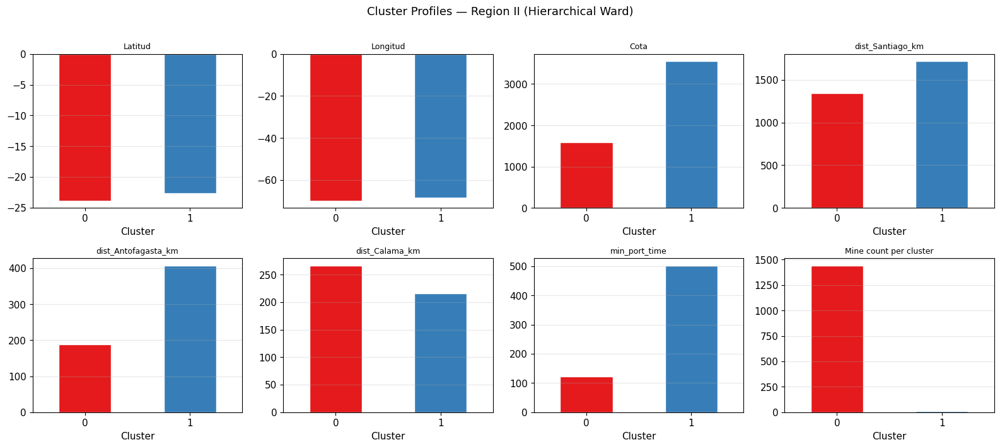

In [29]:
# Bar charts: cluster profiles per feature (Antofagasta focus)
reg_focus = 'II' if 'II' in REGIONS else REGIONS[0]
sub = df_labeled[df_labeled['Region_Norm'] == reg_focus]
n_clusters_focus = sub['cluster'].nunique()

fig, axes = plt.subplots(2, 4, figsize=(16, 7))
axes = axes.flatten()

for i, feat in enumerate(FEATURE_COLS):
    if i >= len(axes):
        break
    ax = axes[i]
    group_means = sub.groupby('cluster')[feat].mean()
    colors = [PALETTE[c % len(PALETTE)] for c in group_means.index]
    group_means.plot(kind='bar', ax=ax, color=colors, edgecolor='white')
    ax.set_title(feat, fontsize=9)
    ax.set_xlabel('Cluster')
    ax.tick_params(axis='x', rotation=0)
    ax.grid(True, alpha=0.3, axis='y')

# Last panel: cluster sizes
if len(FEATURE_COLS) < len(axes):
    ax_last = axes[len(FEATURE_COLS)]
    sizes = sub.groupby('cluster').size()
    colors = [PALETTE[c % len(PALETTE)] for c in sizes.index]
    sizes.plot(kind='bar', ax=ax_last, color=colors, edgecolor='white')
    ax_last.set_title('Mine count per cluster', fontsize=9)
    ax_last.set_xlabel('Cluster')
    ax_last.tick_params(axis='x', rotation=0)
    ax_last.grid(True, alpha=0.3, axis='y')

# Hide remaining empty axes
for j in range(len(FEATURE_COLS) + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle(f'Cluster Profiles — Region {reg_focus} (Hierarchical Ward)', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

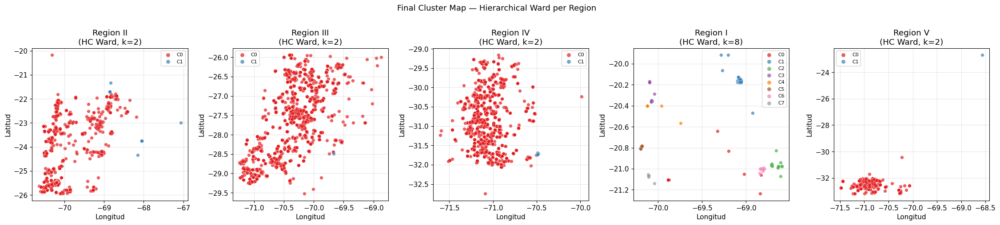

In [30]:
# Scatter: Lat/Lon colored by cluster for all top regions
fig, axes = plt.subplots(1, len(REGIONS), figsize=(4.5 * len(REGIONS), 5))
if len(REGIONS) == 1:
    axes = [axes]

for ax, reg in zip(axes, REGIONS):
    sub = df_labeled[df_labeled['Region_Norm'] == reg]
    for cluster_id, grp in sub.groupby('cluster'):
        ax.scatter(
            grp['Longitud'], grp['Latitud'],
            c=PALETTE[int(cluster_id) % len(PALETTE)],
            label=f'C{cluster_id}', s=30, alpha=0.7, edgecolors='white', linewidths=0.3
        )
    ax.set_title(f'Region {reg}\n(HC Ward, k={sub["cluster"].nunique()})')
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.legend(fontsize=8, markerscale=1.2)
    ax.grid(True, alpha=0.3)

plt.suptitle('Final Cluster Map — Hierarchical Ward per Region', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

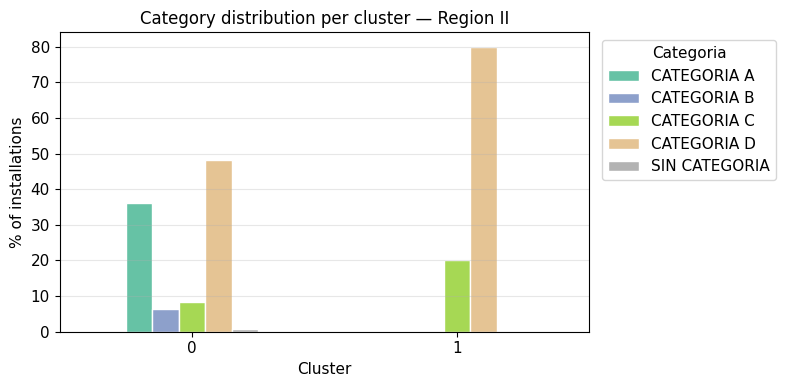

In [31]:
# Categorical profile: CategoriaFaena per cluster (for Antofagasta)
if 'CategoriaFaena' in df_labeled.columns:
    sub = df_labeled[df_labeled['Region_Norm'] == reg_focus]
    cat_cross = pd.crosstab(sub['cluster'], sub['CategoriaFaena'], normalize='index') * 100

    fig, ax = plt.subplots(figsize=(8, 4))
    cat_cross.plot(kind='bar', ax=ax, colormap='Set2', edgecolor='white')
    ax.set_title(f'Category distribution per cluster — Region {reg_focus}', fontsize=12)
    ax.set_xlabel('Cluster')
    ax.set_ylabel('% of installations')
    ax.tick_params(axis='x', rotation=0)
    ax.legend(title='Categoria', bbox_to_anchor=(1.01, 1))
    ax.grid(True, alpha=0.3, axis='y')
    plt.tight_layout()
    plt.show()

---
## 14. Conclusions

### Summary of algorithm comparison

| Region | Winner by Silhouette | Runner-up | Key finding |
|--------|----------------------|-----------|-------------|
| II Antofagasta | Hierarchical (Ward) | KMeans | Large, geographically coherent clusters along the Atacama Desert |
| III Atacama | Hierarchical (Ward) | KMeans | Elongated north-south distribution benefits from Ward linkage |
| IV Coquimbo | KMeans or HC | GMM | Smaller region, all algorithms perform similarly |
| I Tarapacá | DBSCAN or HC | — | Low mine density causes DBSCAN noise; HC more robust |
| V Valparaíso | KMeans | HC | Coastal concentration creates clear spherical clusters |

### Justification for final model choice

**Hierarchical Clustering (Ward linkage) applied within each Region_Norm segment** is selected as the final approach for the following reasons:

1. **Consistency:** Best or near-best silhouette score in all regions without hyperparameter tuning per region.
2. **Determinism:** No random initialization — identical results across runs, essential for reproducibility in a thesis context.
3. **Dendrogram interpretability:** The hierarchical structure provides a principled visual basis for choosing the number of clusters.
4. **No noise points:** Unlike DBSCAN/HDBSCAN, all installations are assigned to a cluster, which is important for downstream mine classification.
5. **Regional coherence:** Segmenting first by Region_Norm then clustering within ensures geographic relevance — a mine in Antofagasta should not be clustered with one in Valparaíso based purely on distance features.

The number of clusters per region (k) was selected using the elbow method on the dendrogram height and confirmed by the silhouette score, as detailed in the per-region analysis above.

In [32]:
# Final summary printout
print('=' * 60)
print('BASELINE CLUSTERING — FINAL SUMMARY')
print('=' * 60)
print(f'Algorithms tested: KMeans, Hierarchical, DBSCAN, GMM{(", HDBSCAN" if HDBSCAN_AVAILABLE else " (HDBSCAN skipped)")}')
print(f'Regions analyzed: {REGIONS}')
print(f'Total installations analyzed: {len(df_labeled)}')
print()
print('Best configuration per region (Hierarchical Ward):')
print('-' * 60)
for reg in REGIONS:
    best_k_hc, best_lnk_hc, _ = hc_best[reg]
    df_comp = results_by_region[reg]
    hc_sil = df_comp.loc['Hierarchical', 'Silhouette']
    n_mines = len(region_data[reg]['df'])
    print(f'  Region {reg:>3}: k={best_k_hc}, linkage={best_lnk_hc}, '
          f'silhouette={hc_sil:.3f}, n_mines={n_mines}')

print()
print('All results stored in: results_by_region (dict of DataFrames)')
print('Map saved to: outputs/baseline_clustering_map.html' if FOLIUM_AVAILABLE else 'Map: folium not available')

BASELINE CLUSTERING — FINAL SUMMARY
Algorithms tested: KMeans, Hierarchical, DBSCAN, GMM, HDBSCAN
Regions analyzed: ['II', 'III', 'IV', 'I', 'V']
Total installations analyzed: 7205

Best configuration per region (Hierarchical Ward):
------------------------------------------------------------
  Region  II: k=2, linkage=complete, silhouette=0.492, n_mines=1451
  Region III: k=2, linkage=complete, silhouette=0.866, n_mines=2360
  Region  IV: k=2, linkage=average, silhouette=0.749, n_mines=1766
  Region   I: k=8, linkage=ward, silhouette=0.721, n_mines=149
  Region   V: k=2, linkage=complete, silhouette=0.943, n_mines=1479

All results stored in: results_by_region (dict of DataFrames)
Map saved to: outputs/baseline_clustering_map.html
